In [1]:
from numpy import array as arr
import numpy as np
from matplotlib.pyplot import *

In [2]:
import plotly.offline as plt
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True);

In [3]:
import os, sys
sys.path.insert(1, os.path.join(sys.path[0], '..'))
import MarksConstants as mc

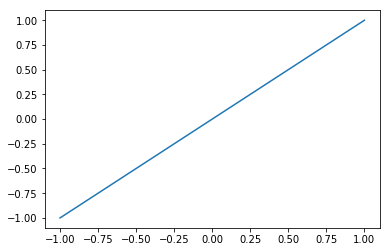

In [4]:
plot([-1,0,1],[-1,0,1])

In [5]:
import matplotlib as mpl

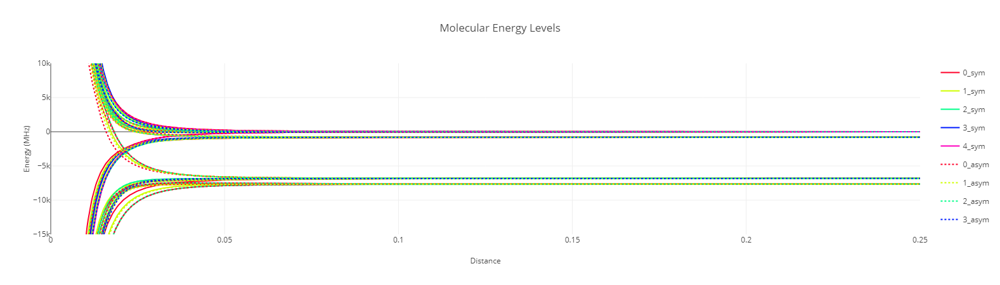

In [6]:
data = []
colors = mpl.cm.get_cmap('gist_rainbow',5)
for c,m in enumerate(np.arange(0,5,1)):
    linename = str(m)+'_sym'
    with open('D'+str(m)+'1.csv') as f:
        lines = f.readlines()
        for i,l in enumerate(lines):
            ls = l.replace('*^','e')
            ln = [float(x) for x in ls[:].split('\t')]
            x = ln[::2]
            y = ln[1::2]
            colorstr = 'rgb'+str(tuple(arr(colors(c)[:3])*255))
            data.append(go.Scatter(x=x,y=y,legendgroup=linename,name=linename,showlegend=i==0,
                                   line={'color':colorstr}))
            
for c,m in enumerate(np.arange(0,5,1)):
    line = str(m)+'_asym'
    with open('D'+str(m)+'-1.csv') as f:
        lines = f.readlines()
        for i,l in enumerate(lines):
            ls = l.replace('*^','e')
            ln = [float(x) for x in ls[:].split('\t')]
            x = ln[::2]
            y = ln[1::2]
            colorstr = 'rgb'+str(tuple(arr(colors(c)[:3])*255))
            data.append(go.Scatter(x=x,y=y,legendgroup=line,name=line,showlegend=i==0,
                                   line={'color':colorstr,'dash':'dot'}))
layout = go.Layout(
    title='Molecular Energy Levels',
    xaxis=dict(
        title='Distance',
        titlefont=dict(size=12),
        range=(0,0.25)
    ),
    yaxis=dict(
        title='Energy (MHz)',
        titlefont=dict(size=12),
        range=(-15e3,10e3))
)
fig = go.Figure(data=data,layout=layout)
plt.iplot(fig)

In [7]:
print(-(mc.Rb87_5P12_ToF2-mc.Rb87_5P12_ToF1)*1e-6)
print(-(mc.Rb87_GroundStateSplitting)*1e-6)
print(-(mc.Rb87_5P12_ToF2-mc.Rb87_5P12_ToF1+mc.Rb87_GroundStateSplitting)*1e-6)


-816.656
-6834.6826109042895
-7651.338610904289


In [8]:
def plotMatplotlib(ax):
    data = []
    colors = ['k']*5#mpl.cm.get_cmap('gist_rainbow',5)
    for c,m in enumerate(np.arange(0,5,1)):
        linename = str(m)+'_sym'
        with open('D'+str(m)+'1.csv') as f:
            lines = f.readlines()
            for i,l in enumerate(lines):
                ls = l.replace('*^','e')
                ln = [float(x) for x in ls[:].split('\t')]
                x = ln[::2]
                y = ln[1::2]
                ax.plot(x,y,label=linename if i == 0 else None, color=colors[c])

    for c,m in enumerate(np.arange(0,5,1)):
        linename = str(m)+'_asym'
        with open('D'+str(m)+'-1.csv') as f:
            lines = f.readlines()
            for i,l in enumerate(lines):
                ls = l.replace('*^','e')
                ln = [float(x) for x in ls[:].split('\t')]
                x = ln[::2]
                y = ln[1::2]
                ax.plot(x,y,label=linename if i == 0 else None,color=colors[c],linestyle='-', linewidth=1)
    #legend()

In [9]:
mpl.rcParams['figure.dpi']= 400

In [57]:
mpl.rc('font', family='cmr10') 
mpl.rcParams['axes.unicode_minus']= False
mpl.rcParams['mathtext.fontset'] = 'cm'
#mpl.rc('font', serif='Helvetica Neue') 
mpl.rc('font', size=8) 

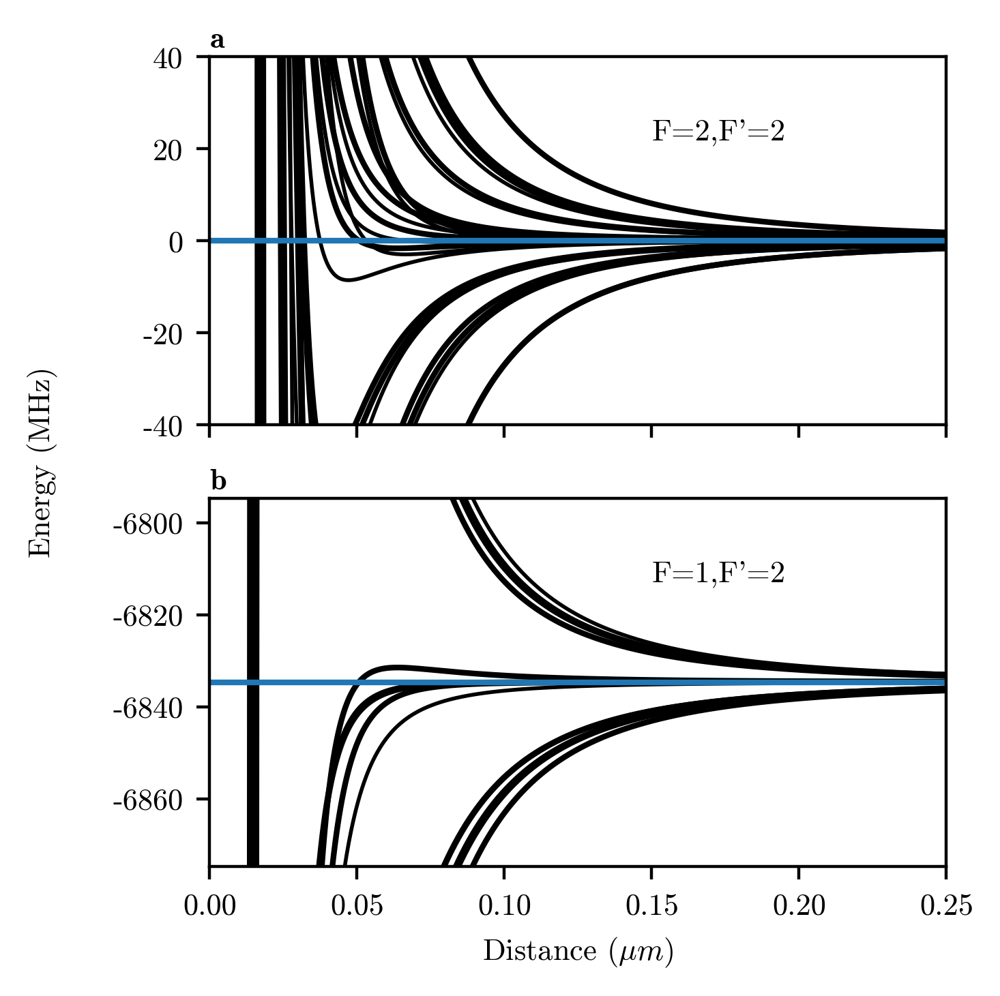

In [60]:
from matplotlib.font_manager import FontProperties
fig = figure(figsize=(20,10))
fs = 8
fig.set_size_inches((3.6,3.6))
a_ = fig.add_subplot(111)
a_.set_ylabel('Energy (MHz)',labelpad=40, fontsize=fs)
a_.set_yticks([])
a_.set_xticks([])
a_.spines['top'].set_visible(False)
a_.spines['right'].set_visible(False)
a_.spines['bottom'].set_visible(False)
a_.spines['left'].set_visible(False)
ax1 = fig.add_subplot(211)
#a = ax[0]
plotMatplotlib(ax1)
ax1.set_xlim(0,0.25)
ax1.set_ylim(-40,40);
#ax1.axhline(20)
#ax1.axhline(-20)
ax1.axhline(0);
ax1.text(0.15,22,"F=2,F'=2", fontsize=fs)
font = FontProperties()
font.set_family('cmb10')
font.set_size( 8 )
ax1.text(0,42,"a", fontproperties=font)

ax2 = fig.add_subplot(212)
plotMatplotlib(ax2)
ax2.set_xlim(0,0.25)
ax2.set_ylim(-40,40);
center = -(mc.Rb87_GroundStateSplitting)*1e-6
ax2.set_ylim(center-40,center+40);
ax2.set_xlabel('Distance ($\mu m$)', fontsize=fs)
ax2.axhline(center)
#ax2.axhline(center+20)
#ax2.axhline(center-20)
ax2.text(0.15,center+22,"F=1,F'=2", fontsize=fs)
ax2.text(0,center+42,"b", fontproperties=font)
ax1.get_shared_x_axes().join(ax1, ax2)
ax1.set_xticklabels([]);
fig.subplots_adjust(top=0.95, left=0.2, right=0.95)
savefig('Molecular_Potentials.png', dpi=400, transparent=True, pad_inches=0 )


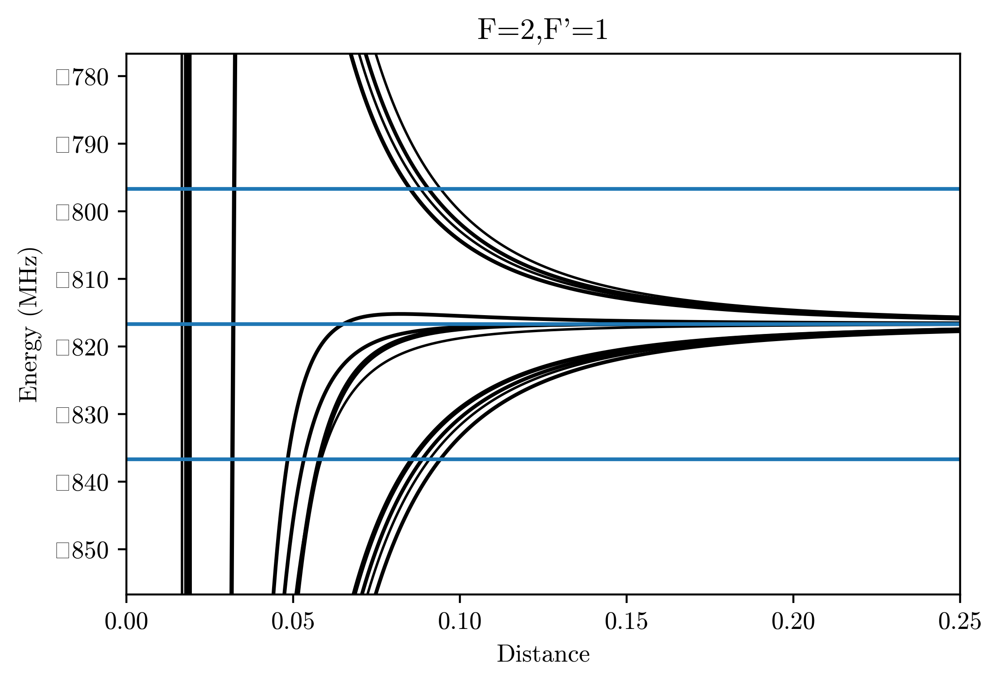

In [25]:
f, ax = subplots()
plotMatplotlib(ax)
xlim(0,0.25)
center = -(mc.Rb87_5P12_ToF2-mc.Rb87_5P12_ToF1)*1e-6
ylim(center-40,center+40);
title("F=2,F'=1")
xlabel('Distance')
ylabel('Energy (MHz)')
axhline(center)
axhline(center+20)
axhline(center-20)

In [ ]:
plotMatplotlib()
xlim(0,0.25)
center = -(mc.Rb87_GroundStateSplitting)*1e-6
ylim(center-40,center+40);
title("F=1,F'=2")
xlabel('Distance')
ylabel('Energy (MHz)')
axhline(center)
axhline(center+20)
axhline(center-20)

In [ ]:
plotMatplotlib()
xlim(0,0.25)
center = -(mc.Rb87_5P12_ToF2-mc.Rb87_5P12_ToF1+mc.Rb87_GroundStateSplitting)*1e-6
ylim(center-40,center+40);
title("F=1,F'=1");
xlabel('Distance')
ylabel('Energy (MHz)')
axhline(center-20)
axhline(center)
axhline(center+20)

### dummy fig